# Stitch Two Pictures Together

Complete the following tasks to experiment with cuts for stitching pictures.

In [2]:
# Don't modify this cell, just run it. 
# get_seam() function is included in EC_CV. 

import numpy as np
import matplotlib.pyplot as plt
import cv2
from EC_CV import *
%config InlineBackend.figure_formats = 'retina'
from matplotlib import rcParams

rcParams['figure.figsize'] = (20,8)


(np.float64(-0.5), np.float64(1212.5), np.float64(803.5), np.float64(-0.5))

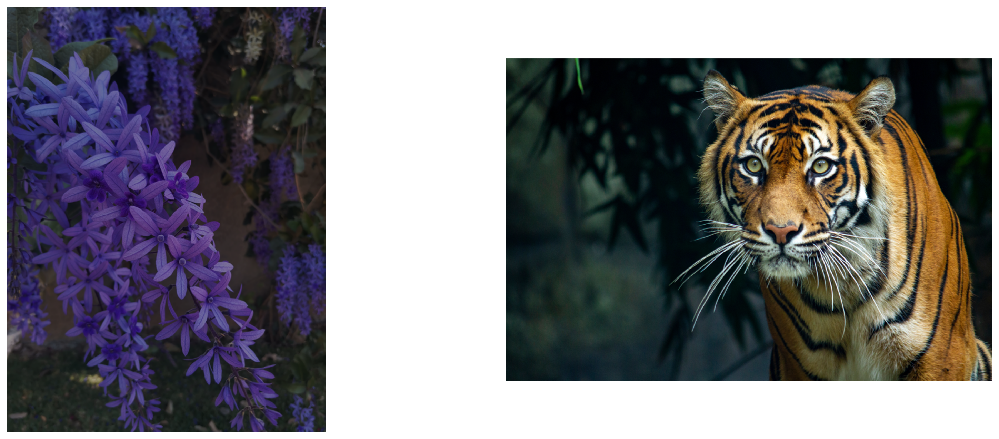

In [46]:
# Task #1: Choose a pair of images to stitch
#
# Copy two image files of your own in this folder, 
# open and display them both.
#
# These two images must have the same height, and must 
# be suitable for stitching together.

# Write your code here
left = plt.imread('Left.bmp')
left_height, left_width, _ = left.shape
right = plt.imread('Right.bmp')
right_height, right_width, _ = right.shape

_, axis = plt.subplots(1, 2)
axis[0].imshow(left);
axis[0].axis("off")
axis[1].imshow(right);
axis[1].axis("off")


(804, 70)

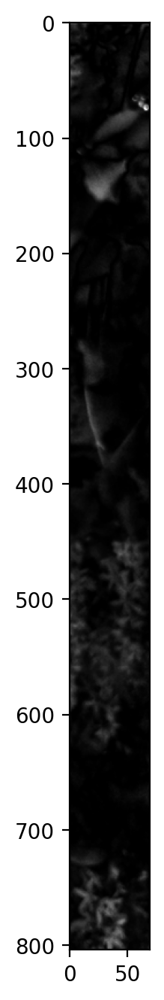

In [47]:
# Task #2: Find a suitable overlap for the 2 images and create a seam.
#
# In this cell, find an appropriate overlap for your images.
# This can be a number as small as 10 pixels, or as large as 100 pixels.
# It all depends on your pictures' resolution.
#
# Then produce an appropriate seam and display it.
# You may do this in several cells.

# Write your code here
overlap = 70

left_gs = np.dot(left[..., left_width-int(overlap):, :3], [0.299,0.587,0.114])
right_gs = np.dot(right[..., :int(overlap), :3], [0.299,0.587,0.114])

diff = cv2.subtract(left_gs,right_gs)
diff = cv2.multiply(diff,diff)

plt.imshow(diff,cmap='gray');
np.shape(diff)

804
70


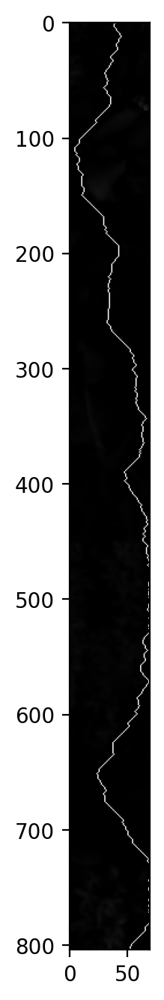

In [48]:
height, width = diff.shape
my_seam = get_seam(diff)

# Show the seam in the squared difference with white pixels
diff_seam = diff.copy()
height, width = diff.shape
for i in range(height):
    diff_seam[i,int(my_seam[i])] = 255 * 255 # This is white squared
plt.imshow(diff_seam,cmap='gray')
print(height)
print(width)

Overlap:  70
Width of the left image:  603
Width of the right image:  1213


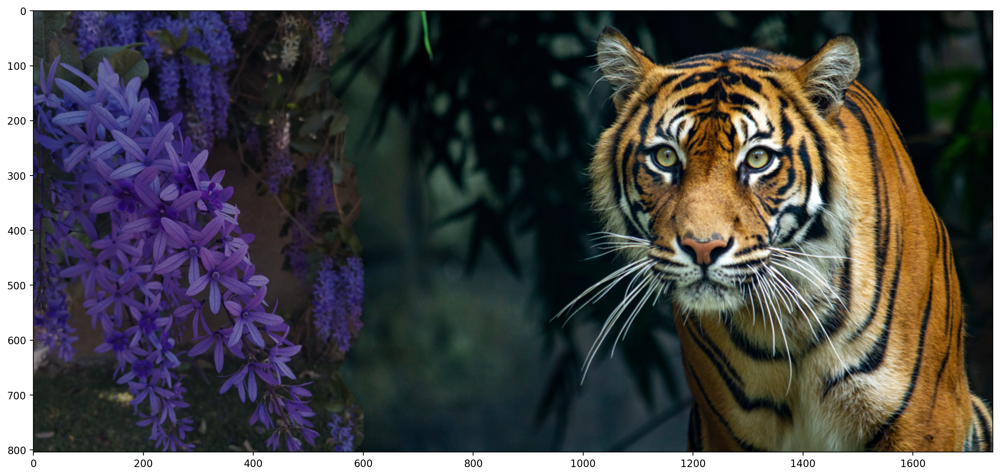

In [52]:
# Task #3: Stitch the images together.
#
# In this cell, put it all together.
# You may use 3 sections like I did.
# Display the final image.

# Write your code here
print('Overlap: ', overlap)
print('Width of the left image: ', left_width)
print('Width of the right image: ', right_width)

# Előre lefoglaljuk a helyet az eredmény tömbbel
result = np.zeros(shape=(left_height, left_width + right_width - overlap, 3), dtype=left.dtype)

for h in range(left_height):
  row = np.concatenate((left[h, :left_width-overlap+int(my_seam[h]), :], right[h, int(my_seam[h]):, :]), axis=0)
  result[h, :row.shape[0], :] = row

_, axis = plt.subplots(1, 1)
axis.imshow(result);

## See any unnatural artifacts? 
## Try again with a different overlap.